In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

df = pd.read_csv('car data.csv')
df2 = 2021 - df['Year']
df['NewYear'] = df2
df.drop(['Car_Name','Year'],axis =1,inplace=True)
final_dataset = pd.get_dummies(df,drop_first=True)
final_dataset.head()

,Selling_Price,Present_Price,Kms_Driven,Owner,NewYear,Fuel_Type_Diesel,Fuel_Type_Petrol,Seller_Type_Individual,Transmission_Manual
0,3.35,5.59,27000,0,7,0,1,0,1
1,4.75,9.54,43000,0,8,1,0,0,1
2,7.25,9.85,6900,0,4,0,1,0,1
3,2.85,4.15,5200,0,10,0,1,0,1
4,4.60,6.87,42450,0,7,1,0,0,1


In [2]:
X = final_dataset.drop(['Selling_Price'],axis =1)
y = final_dataset['Selling_Price']
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

#### Feature Scaling #####
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)

In [3]:
from sklearn.ensemble import ExtraTreesRegressor

In [4]:
reg= ExtraTreesRegressor()
reg.fit(X_train_scaled,y_train)

ExtraTreesRegressor()

In [5]:
reg.feature_importances_

array([0.47848672, 0.02666149, 0.00073714, 0.07792133, 0.04958261,
       0.05239216, 0.27064002, 0.04357853])

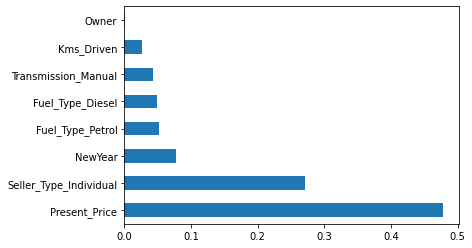

In [6]:
feat_importances = pd.Series(reg.feature_importances_, index=X_train.columns)
feat_importances.nlargest(8).plot(kind='barh')
plt.show()

In [7]:
from sklearn.tree import DecisionTreeRegressor

In [8]:
reg_decision = DecisionTreeRegressor()

In [9]:
reg_decision.fit(X_train_scaled,y_train)

DecisionTreeRegressor()

In [10]:
reg_decision.score(X_train_scaled,y_train)

1.0

In [11]:
reg_decision.score(X_test_scaled,y_test)

0.9088937357737108

In [12]:
y_pred= reg_decision.predict(X_test_scaled)

NOTE: model accuracy is 100 percent on train data and 91.2 percent on test data

r2 square value 0.9088937357737108


c:\users\manojkumar m mhetre\appdata\local\programs\python\python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


MAE: 0.8826315789473684
MSE: 2.9122789473684207
RMSE: 1.7065400514984759


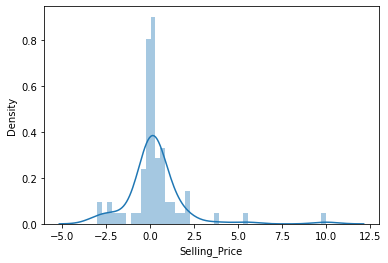

In [13]:
########### calculating r-squared #############
from sklearn.metrics import r2_score
re = r2_score(y_test, y_pred)
print("r2 square value",re)
sns.distplot(y_test-y_pred)
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

In [14]:
#################### GridSearch CV ##################
parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }

from sklearn.model_selection import GridSearchCV

tuning_model=GridSearchCV(reg_decision,param_grid=parameters,scoring='neg_mean_squared_error',cv=3,verbose=3)

In [15]:
grid_search = tuning_model.fit(X_train_scaled, y_train)

Fitting 3 folds for each of 28000 candidates, totalling 84000 fits
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.055 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.098 total time=   0.0s
[CV 3/3

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.912 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_de

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.773 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.413 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-8.169 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-25.904 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END 

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.055 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.554 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END m

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-9.400 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END 

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.542 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-23.363 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-25.057 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END 

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.783 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.721 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.464 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.542 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.398 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.656 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3]

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.737 total time=   0.0s
[CV 3

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.812 total time=   0.0s
[CV 2

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.958 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-16.540 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.958 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-26.894 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-23.783 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.969 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] E

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.318 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-14.339 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.590 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-9.027 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-14.512 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.958 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] EN

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.958 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.512 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-25.728 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.958 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.388 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.398 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-34.388 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.452 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-14.371 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-36.486 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.958 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-23.009 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-16.337 total time=   0.0s
[CV 

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.703 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-34.388 total time=   0.0s
[CV 

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.328 total time=   0.0s
[CV 

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-14.783 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-14.512 total time=   0.0s
[CV 

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-36.486 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-16.540 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-14.339 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-16.540 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-34.388 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-16.540 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-23.009 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.318 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-14.783 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.328 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.318 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-37.647 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-16.540 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-16.540 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-16.540 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-14.371 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.318 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] EN

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.473 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] E

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-14.512 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-16.540 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.240 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-14.371 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.318 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.404 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-14.371 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max

[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.838 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.303 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-9.044 total time=   0.0s
[CV 2/3] END max_de

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-9.838 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_dep

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.660 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.585 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.432 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.258 total time=   0.0s
[CV 3/3] END 

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.904 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END 

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.721 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-25.756 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.283 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.093 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END 

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-23.363 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.173 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.404 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.721 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-7.912 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END m

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.695 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.501 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.025 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.003 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3]

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.803 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-9.094 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.675 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-19.612 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.499 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.292 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-20.002 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.283 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.325 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.587 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.045 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.358 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_dep

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-26.398 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.136 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-6.679 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.326 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_dep

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.624 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-6.094 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-4.952 total time=   0.0s
[CV 2/3] END max_dep

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.836 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-11.419 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END 

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.638 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-25.828 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-6.442 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_dep

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.370 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.725 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.016 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.369 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-25.828 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-26.173 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-4.278 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.082 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.045 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-26.398 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.599 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.283 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.747 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.546 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.224 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.570 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-17.731 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.872 total time=   0.0s
[CV 1/3] END

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.706 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.976 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.226 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.701 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-28.903 total time=   0.0s
[CV 3/3]

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.620 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.594 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.473 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-27.466 total time=   0.0s
[CV 

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.943 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s


[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.943 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-21.798 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.098 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.323 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.363 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-7.773 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-3.865 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.704 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.743 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.862 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-24.278 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.678 total time=   0.0s
[CV 1/3] END

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.833 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.536 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.333 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.499 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.569 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-5.759 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.643 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.226 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.613 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] E

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-4.469 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.136 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.532 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.198 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-20.656 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.752 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END ma

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.320 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-19.121 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-7.978 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-4.469 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-11.438 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] E

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.432 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.726 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.200 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.502 total time=   0.0s
[CV 2/3] END max_d

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.219 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.698 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.234 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.709 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.029 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-25.408 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.565 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-17.071 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.226 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.481 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.320 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.225 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.146 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.216 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-5.853 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.862 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.481 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.714 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-31.818 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.086 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.846 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.660 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.836 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-24.754 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.154 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.385 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.662 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.054 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.318 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.593 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.386 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.959 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.741 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.780 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.732 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.590 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.794 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-21.486 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.479 total time=   0.0s
[CV 1/

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.703 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-24.805 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.573 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.566 total time=   0.0s
[CV 

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.050 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.152 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.036 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.873 total time=   0.0s
[CV 3

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.139 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.688 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.103 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-32.822 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-14.371 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-14.271 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.846 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.924 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-35.976 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.344 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.019 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.958 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.725 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.344 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.640 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.331 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.025 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.615 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.013 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-24.890 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.853 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] E

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-25.986 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-17.896 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-36.677 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-16.540 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.924 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.286 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-11.463 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.333 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-28.017 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.373 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-30.774 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.139 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-28.579 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.923 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-27.465 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.185 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.174 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.709 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.243 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.943 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-28.668 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.743 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.857 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.607 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.823 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.141 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-14.628 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.481 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.846 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-11.438 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.596 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-25.351 total time=   0.0s
[CV 3/3] END max

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.427 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.752 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.279 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.170 total time=   0.0s
[CV 1/3] END max

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.197 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.315 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.106 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.710 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.553 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.084 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-14.539 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.978 total time=   0.0s
[CV 3/3] END m

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.943 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-20.670 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-22.944 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.398 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.394 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_d

[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-28.903 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.930 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.195 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.421 total time=   0.0s
[CV 1/3] END m

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.329 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.804 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.517 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.995 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.512 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s


[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.870 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-21.104 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.375 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-24.503 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.181 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-28.870 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.547 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.516 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-25.728 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-21.362 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.764 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.082 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.850 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.542 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.966 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.743 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-7.586 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END m

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-23.808 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-3.606 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.909 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.366 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.200 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-25.756 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.304 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.138 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-24.503 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.511 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.373 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.716 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.045 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_d

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-25.728 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-21.362 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-26.739 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-8.655 total time=   0.0s
[CV 2/3] END 

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.242 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.595 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.189 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.972 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.623 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END ma

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-4.317 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.565 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-6.759 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3]

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.441 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.760 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.479 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_d

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-4.151 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_de

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.499 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.429 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.198 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.990 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.212 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.922 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.756 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.529 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] EN

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.198 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.068 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.264 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.784 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.285 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-17.045 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.971 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-4.989 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.178 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.011 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-17.977 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.542 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.453 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-25.130 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-3.990 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.743 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.523 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-25.828 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.823 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-26.398 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.453 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-5.845 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-25.820 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END ma

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-14.371 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.297 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.036 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.481 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.319 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.184 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-25.052 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.714 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-25.880 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.333 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.053 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.394 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.681 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.518 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-7.045 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-28.637 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.157 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.126 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.547 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.952 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-13.079 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.755 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-18.997 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.535 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-23.495 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.563 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.753 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-36.524 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.216 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-4.151 total time=   0.0s
[CV 2/3] END max_d

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.593 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.242 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.662 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.361 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-30.248 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.141 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-7.760 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.694 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.200 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-11.463 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-9.100 total time=   0.0s
[CV 2/3] END 

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.315 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.741 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END 

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.320 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-25.728 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.665 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.982 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.141 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.891 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.595 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.593 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.425 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.181 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.448 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.031 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.104 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.674 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.719 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.943 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.674 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.943 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.481 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.481 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.340 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.333 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-21.433 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-12.431 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.849 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max

[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.320 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-9.020 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.124 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.473 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.484 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.732 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.490 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.512 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.846 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.825 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.836 total time=   0.0s
[CV 3

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.958 total time=   0.0s
[CV 

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-30.416 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.972 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.660 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-32.993 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.633 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-21.634 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.887 total time=   0.0s
[CV 1

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.597 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-18.627 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.870 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] EN

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.388 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.749 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.008 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.928 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.460 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.542 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.056 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.224 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.005 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] EN

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.139 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.104 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] E

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.219 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.567 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.746 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.005 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.732 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.267 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-34.047 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.216 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.542 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.348 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.072 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.259 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-22.944 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.320 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.780 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-17.896 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.011 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.293 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.259 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.771 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.567 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.849 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.588 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-12.189 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.594 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.836 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.813 total time=   0.0s
[CV 2/3] END max

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.677 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.376 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.780 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.318 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-25.986 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-4.285 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.520 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.943 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.219 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-14.371 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.710 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-37.047 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.798 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-25.776 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.979 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.549 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.984 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.567 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-22.944 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.320 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] E

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-9.400 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.568 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-14.371 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-22.944 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-19.037 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-14.957 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.743 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.043 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.809 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.334 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-24.724 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.993 total time=   0.0s
[CV 1/3]

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.337 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.253 total time=   0.0s
[CV 2/3] END

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.224 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.322 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.452 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-24.540 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-4.608 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-19.133 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.059 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-16.787 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-6.084 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_dep

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-7.380 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.439 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.323 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.512 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.122 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.696 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.786 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.733 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.166 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.924 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_dep

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_de

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.586 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.743 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.568 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_dep

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.560 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.845 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-23.335 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.195 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-6.563 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-24.503 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.585 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.780 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.707 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-5.734 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-19.963 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-6.276 total time=   0.0s
[CV 1/3] END max_dep

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-4.732 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.422 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.969 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-9.526 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_dep

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-6.475 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.315 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.294 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.237 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.919 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.773 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.930 total time=   0.0s
[CV 1/3

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-25.820 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.273 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.277 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-7.248 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-26.031 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-20.919 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-6.323 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-21.271 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-8.335 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.005 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.906 total time=   0.0s
[CV 2/3] END ma

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.836 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-21.742 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.760 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-6.993 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.881 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-11.419 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-25.643 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-20.539 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-5.937 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_dep

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] EN

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-19.296 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.623 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.667 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-17.926 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-5.498 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.013 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.189 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.272 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.203 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.214 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.175 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.248 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-5.488 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.369 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.172 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.046 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-7.856 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_de

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.841 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.184 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.481 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.394 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.587 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-21.353 total time=   0.0s
[CV 3

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.139 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.943 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s


[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.360 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.864 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-20.672 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.394 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.777 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.485 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-28.351 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-4.829 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-16.888 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.662 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.268 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-17.949 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.226 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.198 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.569 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.701 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.553 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.119 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.104 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.572 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-26.028 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.943 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.208 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.893 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.337 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.102 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.358 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.938 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.047 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.846 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.315 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.226 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.456 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.242 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_dep

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.864 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-18.710 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.894 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.840 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.404 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.984 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.454 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.139 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.943 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_d

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.719 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.958 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.444 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.429 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.394 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.649 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.785 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.141 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.294 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-4.506 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.780 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.541 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-29.901 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.328 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.460 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.027 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.036 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.104 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.589 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.248 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.029 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-20.607 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.139 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.120 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.035 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.411 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-7.438 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-7.816 total time=   0.0s
[CV 2/3] END max_d

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.498 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.184 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.836 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-6.696 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.025 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.141 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.725 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.557 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.216 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-4.989 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.819 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.319 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.609 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-20.686 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.753 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.873 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.775 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-14.245 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-19.593 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.820 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.457 total time=   0.0s
[CV 3

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.872 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.106 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-12.244 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.502 total time=   0.0s
[CV 2

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.709 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.010 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.505 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.215 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.005 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.226 total time=   0.0s
[CV 1/3] END max_dep

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.936 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.738 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-30.791 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.135 total time=   0.0s
[CV 2/3] END max

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.139 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.435 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.873 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.944 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.319 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.316 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.139 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.719 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.567 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-12.431 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.300 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.456 total time=   0.0s
[CV 3/3] END max

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.327 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.720 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-28.579 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-17.761 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.164 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.218 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.635 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.467 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.215 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.780 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.481 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.157 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-6.177 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-4.399 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-20.643 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.979 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.221 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.141 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.223 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.895 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.015 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.621 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-9.400 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.801 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-21.600 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.104 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.767 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.832 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.180 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.958 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-13.079 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-32.981 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.358 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.780 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.106 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.033 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.485 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.725 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.984 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] E

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.481 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.090 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.139 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.544 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.398 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.477 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.315 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.943 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-14.371 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max

[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.460 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.943 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.102 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.200 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-16.088 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.319 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.139 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.585 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.872 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-5.299 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-6.335 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_dep

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.509 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.287 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_dep

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-11.419 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.485 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.320 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.765 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.406 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-5.705 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-9.766 total time=   0.0s
[CV 1/3] END m

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.832 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.587 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.779 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.835 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END ma

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.749 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_dep

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-25.756 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.675 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.369 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.925 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-17.831 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.836 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.445 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-20.205 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.286 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.768 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_dep

[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-8.703 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END ma

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.246 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.109 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.557 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.369 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.332 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.024 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-17.668 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.186 total time=   0.0s
[CV 1/

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.145 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.820 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.847 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-21.448 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-9.520 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_dep

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.568 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END 

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.191 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.234 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.842 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-8.786 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.542 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.285 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-17.895 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.974 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_d

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.730 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.676 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-17.574 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.909 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.267 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-36.724 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.413 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.313 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-6.607 total time=   0.0s
[CV 1/3] END max_dep

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.542 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.369 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END 

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.300 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.607 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-16.789 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.112 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-11.419 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.612 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.743 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-25.756 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.055 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.557 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.062 total time=   0.0s
[CV 

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-30.447 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.821 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-19.766 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.957 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.547 total time=   0.0s
[C

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.394 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.675 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.846 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-17.896 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.674 total time=   0.0s
[CV 2/3] END max_de

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.392 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.742 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.958 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.083 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-23.130 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.060 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.780 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.528 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.780 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.532 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.139 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.146 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.287 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.200 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.714 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.814 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-24.169 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.646 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.155 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.315 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.943 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-6.435 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-9.400 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.706 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.846 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.315 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.481 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.025 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-16.571 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.780 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-7.376 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.104 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.460 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.104 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.643 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-4.212 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.467 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.656 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.308 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.450 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.618 total time=   0.0s
[CV 1/3] END max_de

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] E

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-4.150 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.030 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.580 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.113 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.104 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.182 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-6.365 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.777 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.719 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.682 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.185 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.653 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.727 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.684 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-26.739 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.496 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.172 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.177 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.218 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.104 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.684 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.938 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.886 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.958 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.943 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.473 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.279 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.771 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-28.579 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.528 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_d

[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-14.371 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.567 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.582 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.404 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.836 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.723 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.318 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.726 total time=   0.0s
[CV 3

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.541 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-22.944 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.267 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.873 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.262 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.708 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.699 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.639 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.958 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.226 total time=   0.0s
[CV 1/3] END

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.943 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.436 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-14.937 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.958 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-19.050 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.383 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.817 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.311 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.968 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.999 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.025 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.786 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.422 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.269 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.335 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.641 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.475 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.333 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-18.787 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.817 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-6.516 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.104 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.579 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.247 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-13.684 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.672 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.095 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.716 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-34.388 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.151 total time=   0.0s
[CV 2/3] END max

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-4.242 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.968 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.006 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.832 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.755 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.725 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.938 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-6.295 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.087 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.180 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.953 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.743 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.635 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.363 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.767 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.242 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-6.508 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.217 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-20.307 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.991 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.166 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.725 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] E

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.798 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-24.783 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.581 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.874 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-24.109 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-13.768 total time=   0.0s
[CV 1/3] END max

[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.985 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-20.785 total time=   0.0s
[CV 3/3

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-25.756 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.608 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.039 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.501 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-5.601 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.337 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.205 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.368 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.333 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.194 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.076 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.054 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_de

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.297 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_d

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.276 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.540 total time=   0.0s
[CV 3/3] END 

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-5.398 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.369 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_de

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_d

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.416 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.870 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-16.836 total time=   0.0s
[CV 3/3] END max_d

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-28.823 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_de

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-26.258 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_de

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_d

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.382 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.342 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.584 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-5.476 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_de

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.655 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END 

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.132 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.149 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-6.242 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.675 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-21.305 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-9.609 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_dep

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.366 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-23.148 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-4.735 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_de

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_d

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-26.031 total time=   0.0s
[CV 3/3] END max_d

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.1s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-16.968 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.974 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_d

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.544 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.768 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_de

[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_d

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_

[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_

[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s


[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s


[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s


[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s


[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] EN

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.831 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-21.044 total time=   0.0s
[CV 3/3] END 

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.931 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.650 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.882 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END 

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END 

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.459 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.209 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-24.942 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END 

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.241 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.281 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.533 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END 

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] EN

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END 

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] EN

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.474 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.675 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END 

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] E

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-25.756 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.237 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.921 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.214 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-6.696 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.369 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.234 total time=   0.0s
[CV 2/3] END

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-19.634 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END 

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.043 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.563 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-5.660 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.920 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END m

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.111 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.392 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END 

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-24.243 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-9.449 total time=   0.0s
[CV 1/3] END m

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-21.104 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.279 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.536 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.585 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END 

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END 

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] 

[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-3.930 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.238 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.266 total time=   0.0s
[CV 1/3] END 

[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.258 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END 

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-26.099 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.005 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.660 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.456 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.246 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s


[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.466 total time=   0.0

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.542 total time=   0.0s

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.487 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-18.190 total time=   0.0s

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.719 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-21.029 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.767 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.266 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.141 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.506 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.701 total time=   0.0s
[CV 2/3] END

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.836 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.528 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-19.316 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.613 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-4.760 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-22.962 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.527 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.700 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-28.240 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.164 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.481 total time=   0.0s
[CV 3/3] END 

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] E

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-22.962 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-14.371 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] EN

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.348 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.133 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.986 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.246 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.315 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END 

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.648 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.168 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.711 total time=   0.0s
[CV 1/3] 

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] EN

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.846 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-30.712 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-7.376 total time=   0.0s
[CV 1/3] END

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.481 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.320 total time=   0.0s
[CV 1/3] END

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.020 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.724 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.780 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.090 total time=   0.0s
[CV 1/3] END

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.836 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.773 total time=   0.0s
[CV 2/3] END

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.084 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.585 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-28.754 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.984 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-9.495 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END 

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.007 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-21.515 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.775 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.468 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.662 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.645 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.218 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.323 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-21.451 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.129 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.113 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.833 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.629 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.128 total time=   0.0s
[CV 2/3] END

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.057 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.656 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.442 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-4.506 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-35.209 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.797 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] E

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.787 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.308 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.654 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.032 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.660 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-28.903 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.360 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.994 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-19.037 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.665 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.970 total time=   0.0s
[CV 1/3] END

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.221 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.837 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.318 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-29.307 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.603 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.963 total time=   0.0s
[CV 2/3]

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-7.972 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.200 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.242 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.178 total time=   0.0s
[CV 1/3] END

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] E

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.163 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-18.602 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.924 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.441 total time=   0.0s
[CV 2/3] E

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.853 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.893 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-23.553 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.497 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.831 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.951 total time=   0.0s
[CV 3/3] END 

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.510 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] E

[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] E

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.315 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.719 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.567 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.719 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.219 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.771 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.039 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.683 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.239 total time=   0.0s
[CV 1/3] END

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.460 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.701 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.775 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-36.251 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-26.398 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.219 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] EN

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-13.961 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-18.706 total time=   0.0s
[CV 3/3] E

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-37.047 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.383 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.410 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.724 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-12.169 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-20.679 total time=   0.0s
[CV 3/

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] E

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.001 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.154 total time=   0.0s
[CV 3/3] EN

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-25.756 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] EN

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-14.998 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.432 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.360 total time=   0.0s
[CV 1/3] E

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.410 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.477 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.422 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.814 total time=   0.0s
[CV 3/3] EN

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.333 total time=   0.0s
[CV 2/

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.605 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-21.618 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.292 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.141 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.410 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.449 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.018 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.382 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.044 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-30.540 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-16.476 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-9.365 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-25.157 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.614 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.219 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.365 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.027 total time=   0.0s
[CV 2/3] END

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.428 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.836 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.636 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] E

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-21.399 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] E

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-36.641 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-20.014 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.069 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.226 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.862 total time=   0.0s
[CV 2/3

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] E

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.567 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] EN

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.510 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.857 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.481 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.532 total time=   0.0s
[CV 1/3] END

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.215 total time=   0.0s
[CV 2/3] EN

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.671 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-12.754 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.321 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.485 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.473 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] E

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-19.037 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.369 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.369 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.678 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.657 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.287 total time=   0.0s
[CV 2/3] END

[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.235 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] E

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.369 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s


[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.655 total time=   0.0s
[

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.542 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END 

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-26.028 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END 

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-26.099 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] 

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.398 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.612 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.743 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.512 total time=   0.0s
[CV 1/3] END

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.007 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END 

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.004 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-25.097 total time=   0.0s
[CV 3/3] END 

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-6.018 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.000 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.558 total time=   0.0s
[CV 3/3] END

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.499 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-5.692 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.191 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-6.491 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END m

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.211 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-24.243 total time=   0.0s
[CV 3/3] END 

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.757 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.743 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.259 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.101 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END 

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.922 total time=   0.0s
[CV 2/3] END 

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-21.463 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.628 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END m

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-26.739 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END 

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-19.062 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.212 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END 

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.542 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2

[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] EN

[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-17.808 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.152 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END

[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-9.020 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-19.411 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.197 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=None, max_leaf_nodes=90, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END 

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-25.904 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-9.764 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-6.139 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[C

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-20.873 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.240 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-21.502 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END 

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-25.904 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.773 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-20.873 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END 

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END 

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-7.675 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END 

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.118 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.397 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.212 total time=   0.0s
[CV 1/3] END

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-11.419 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END 

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-6.264 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.286 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END 

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.114 total time=   0.0s
[CV 2/3] E

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] EN

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-26.031 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.947 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.580 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.369 total time=   0.0s
[CV 1/3] END 

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.200 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.667 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.038 total time=   0.0s
[CV 1/3] END

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.734 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-21.074 total time=   0.0s
[CV 3/3] END m

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END 

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.585 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END 

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.313 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.058 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.281 total time=   0.0s
[CV 1/3] END 

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.279 total time=   0.0s
[CV 2/3] END

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-5.719 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.632 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END 

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END 

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END

[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.978 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.743 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.913 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END m

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END 

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.470 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-19.091 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.947 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END m

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.778 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.743 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END 

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.511 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-4.176 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-11.765 total time=   0.0s
[CV 1/3] END 

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END 

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-9.556 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END

[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.668 total time=   0.0s
[CV 

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-14.820 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-23.137 total time=   0.0

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.237 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-18.017 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.356 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.418 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.013 total time=   0.0s

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.342 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-19.327 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.549 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.923 total time=   0.0s

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.510 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.798 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.322 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.031 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-6.645 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-7.773 total time=   0.0s
[

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.617 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.770 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.122 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.958 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.076 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-6.452 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.259 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.859 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-14.891 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.873 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.626 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.737 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.780 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.732 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END 

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.557 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.958 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.602 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.189 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.200 total time=   0.0s
[CV 3/3] END 

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.610 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.394 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.771 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-19.780 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.362 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.956 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.584 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.072 total time=   0.0s
[CV 3/3] E

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] E

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.971 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.846 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.139 total time=   0.0s
[CV 2/3] END

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.328 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-13.388 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.139 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.696 total time=   0.0s
[CV 3

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] E

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.226 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.135 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.836 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.216 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.923 total time=   0.0s
[CV 2/3] EN

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.984 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] EN

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.582 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.411 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.403 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-14.891 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.836 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.246 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.201 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.557 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.242 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.362 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.576 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.958 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-7.773 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] E

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.719 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.283 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.814 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.743 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.694 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.481 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.285 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.445 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.553 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.360 total time=   0.0s
[CV 1/3] END

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-13.927 total time=   0.0s
[CV 2/3] E

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=6, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] E

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=best;, score=-15.460 total time=   0.0s
[CV 2/3] E

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] E

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-26.031 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.081 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.398 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.711 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-32.981 total time=   0.0s
[CV 3/3] END 

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] E

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.219 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.594 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.036 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-25.986 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.678 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END 

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.185 total time=   0.0s
[CV 2/3] E

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-9.427 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-36.674 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.139 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.922 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-12.122 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.265 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.226 total time=   0.0s
[CV 1/3] END 

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.895 total time=   0.0s
[CV 2/3] EN

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] E

[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.927 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.514 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.656 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.138 total time=   0.0s
[CV 2/3] END

[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.051 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.429 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.866 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-24.646 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.801 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.258 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-13.079 total time=   0.0

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.216 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-22.962 total time=   0.0s

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-16.337 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.095 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.460 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END 

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.069 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-16.954 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.621 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-12.752 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.846 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] E

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.364 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.833 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.106 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.743 total time=   0.0s
[CV 3/

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.351 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.008 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-14.937 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-13.874 total time=   0.0s
[CV 2/3] E

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.366 total time=   0.0s
[CV 2/3] E

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.283 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] E

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] E

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] E

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.735 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] E

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] EN

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.508 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] E

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.699 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.775 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.867 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] E

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.216 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.439 total time=   0.0s
[CV 3/3] E

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.444 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-6.058 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.695 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.429 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=best;, score=-32.981 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.249 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.617 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-11.965 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.266 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-25.244 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-14.339 total time=   0.0s
[CV 1/3] E

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-22.726 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-10.423 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-9.133 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-14.371 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-10.144 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.255 total time=   0.0s
[CV 3/3] E

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.936 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-5.845 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-26.737 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-37.452 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.398 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.129 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-36.696 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.528 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-36.641 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.714 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] EN

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.594 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.568 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.477 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-26.737 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=best;, score=-9.242 total time=   0.0s
[CV 1/3] END

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-26.559 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.753 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.095 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.190 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.832 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.426 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-4.469 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-23.059 total time=   0.0s
[CV 3/3] END 

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-8.503 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-18.410 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.124 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] E

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-9.097 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.743 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-7.201 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-36.958 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-13.768 total time=   0.0s
[CV 1/3] END 

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] E

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=80, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.378 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-22.122 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-13.768 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.865 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-14.713 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-21.664 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-8.939 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.920 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] EN

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=random;, score=-11.419 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-7.773 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=6, min_weight_fraction_leaf=0.3, splitter=best;, score=-12.542 total time=   0.0s
[CV 1/3] END

[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] E

[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-8.329 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-7.581 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=sqrt, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-22.846 total time=   0.0s
[CV 3/

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.825 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.441 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.525 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s


[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.168 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s


[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.250 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.569 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.952 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s


[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.955 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.253 total time=   0.0s
[

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-6.703 total time=   0.

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] EN

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] EN

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END 

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.638 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.473 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-15.902 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.696 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=6, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-11.419 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END 

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.412 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=2, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.273 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-21.952 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=5, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.195 total time=   0.0s
[CV 1/3] END

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END 

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-25.756 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END 

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-14.285 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.009 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.674 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-26.258 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=9, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] EN

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=2, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] EN

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=3, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=4, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.105 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.771 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.788 total time=   0.0s
[CV 1/3] END

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-5.618 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=8, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END 

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.568 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=2, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] EN

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.474 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-20.185 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.974 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=7, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=9, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END 

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.257 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=1, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] EN

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END 

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=6, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] EN

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-27.466 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.3, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.665 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=7, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.931 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.230 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.292 total time=   0.0s
[CV 1/3

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.260 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.2, splitter=random;, score=-12.542 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=2, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END 

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=4, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=best;, score=-6.175 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-9.159 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-19.233 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=7, min_weight_fraction_leaf=0.1, splitter=random;, score=-10.936 total time=   0.0s
[CV 1/3] END 

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-36.697 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=8, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] EN

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=80, min_samples_leaf=10, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3

[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-23.460 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.2, splitter=random;, score=-10.775 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.529 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-21.480 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=3, min_weight_fraction_leaf=0.3, splitter=best;, score=-6.336 total time=   0.0s
[CV 1/3] END 

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-25.961 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=best;, score=-8.349 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-36.749 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.4, splitter=random;, score=-18.910 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=5, min_weight_fraction_leaf=0.5, splitter=best;, score=-8.850 total time=   0.0s
[CV 2/3] END

[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=best;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-15.521 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-37.303 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=7, min_weight_fraction_leaf=0.5, splitter=random;, score=-18.776 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-5.586 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=8, min_weight_fraction_leaf=0.1, splitter=best;, score=-17.543 total time=   0.0s
[CV 3/3] EN

[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-22.164 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.1, splitter=random;, score=-11.937 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-5.622 total time=   0.0s
[CV 2/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-21.487 total time=   0.0s
[CV 3/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=best;, score=-6.063 total time=   0.0s
[CV 1/3] END max_depth=12, max_features=None, max_leaf_nodes=90, min_samples_leaf=10, min_weight_fraction_leaf=0.2, splitter=random;, score=-8.812 total time=   0.0s
[CV 2/3

In [16]:
grid_search.best_params_

{'max_depth': 12,
 'max_features': 'log2',
 'max_leaf_nodes': 30,
 'min_samples_leaf': 7,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [18]:
tuned_hyper_model= DecisionTreeRegressor(max_depth=12,
 max_features= 'log2',
 max_leaf_nodes= 30,
 min_samples_leaf=7,
 min_weight_fraction_leaf=0.1,
 splitter='best')

In [19]:
tuned_hyper_model.fit(X_train_scaled,y_train)

DecisionTreeRegressor(max_depth=12, max_features='log2', max_leaf_nodes=30,
                      min_samples_leaf=7, min_weight_fraction_leaf=0.1)

In [20]:
tuned_pred=tuned_hyper_model.predict(X_test_scaled)

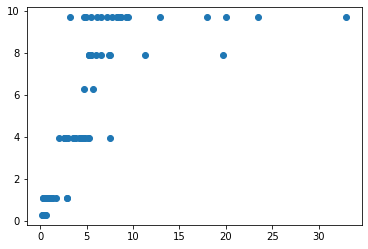

In [21]:
plt.scatter(y_test,tuned_pred)

r2 square value 0.46578375048382614


c:\users\manojkumar m mhetre\appdata\local\programs\python\python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


MAE: 2.1088343544338595
MSE: 17.076616520504164
RMSE: 4.132386298557307


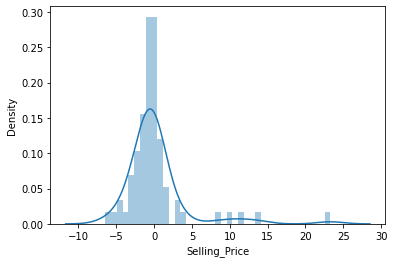

In [22]:
########### calculating r-squared #############
from sklearn.metrics import r2_score
re = r2_score(y_test, tuned_pred)
print("r2 square value",re)
sns.distplot(y_test-tuned_pred)
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, tuned_pred))
print('MSE:', metrics.mean_squared_error(y_test, tuned_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, tuned_pred)))

In [23]:
tuned_hyper_model.score(X_train_scaled,y_train)

0.5189971226910762

In [24]:
tuned_hyper_model.score(X_test_scaled,y_test)

0.46578375048382614